In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov11

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/My Drive/yolov11


In [ ]:
!pip install wandb

In [ ]:
import os
os.environ["WANDB_DIR"] = "/content/"

In [ ]:
import wandb
wandb.login(key="")

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: [wandb.login()] Using explicit session credentials for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: nyinyimyo (nyinyimyo-khon-kaen-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/train/images")
count_images("/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/valid/images")
count_images("/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/train/sem_seg")
count_images("/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/valid/sem_seg")

Total images: 1500
Total images: 270
Total images: 1500
Total images: 270


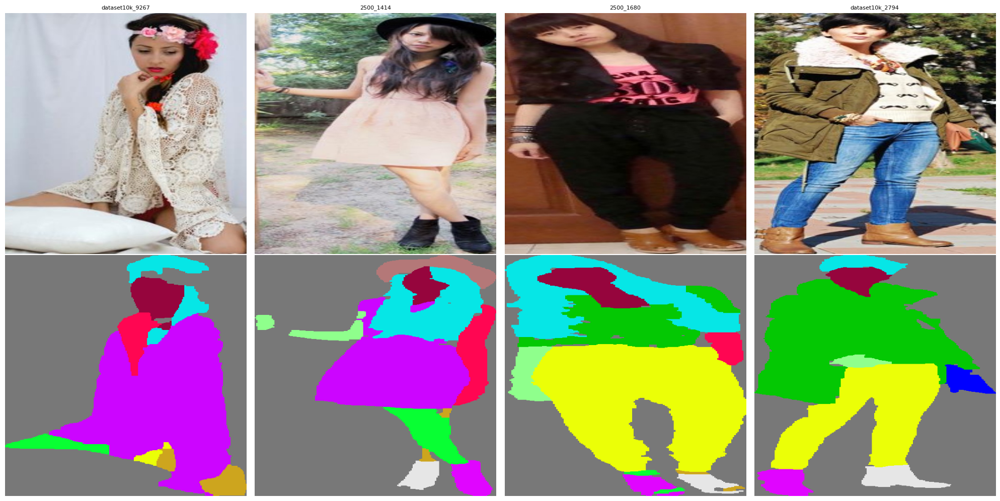

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

IMG_DIR = "/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/train/images"
MASK_DIR = "/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/train/sem_seg"

CATEGORY_COLORS = {
    0: [120, 120, 120],
    1: [180, 120, 120],
    2: [6, 230, 230],
    3: [80, 50, 50],
    4: [4, 200, 3],
    5: [140, 190, 214],
    6: [235, 255, 7],
    7: [204, 5, 255],
    8: [230, 230, 230],
    9: [230, 230, 230],
    10: [224, 5, 255],
    11: [150, 5, 61],
    12: [205, 165, 30],
    13: [8, 255, 51],
    14: [255, 6, 82],
    15: [143, 255, 140],
    16: [0, 0, 255],
    17: [255, 51, 7],
}

# --------------------------------------------------
# Randomly select 4 samples
# --------------------------------------------------

image_files = [
    f for f in os.listdir(IMG_DIR)
    if f.lower().endswith(".jpg")
]

selected = random.sample(image_files, 4)

# --------------------------------------------------
# Show:
# Row 1 = Original Image
# Row 2 = Colored Mask
# --------------------------------------------------

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for col, img_name in enumerate(selected):

    stem = os.path.splitext(img_name)[0]

    img_path = os.path.join(
        IMG_DIR,
        stem + ".jpg"
    )

    mask_path = os.path.join(
        MASK_DIR,
        stem + ".png"
    )

    # image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # mask
    mask = cv2.imread(
        mask_path,
        cv2.IMREAD_GRAYSCALE
    )

    color_mask = np.zeros(
        (mask.shape[0], mask.shape[1], 3),
        dtype=np.uint8
    )

    for cls_id, color in CATEGORY_COLORS.items():
        color_mask[mask == cls_id] = color

    # Row 1: Image
    axes[0, col].imshow(img)
    axes[0, col].set_title(stem, fontsize=8)
    axes[0, col].axis("off")

    # Row 2: Mask
    axes[1, col].imshow(color_mask)
    axes[1, col].axis("off")

plt.tight_layout()
plt.show()

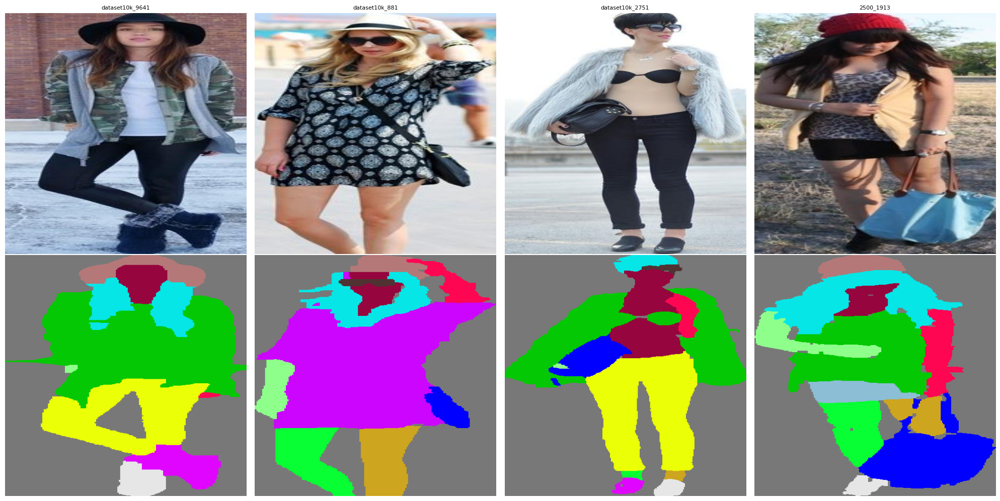

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

IMG_DIR = "/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/valid/images"
MASK_DIR = "/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/valid/sem_seg"

CATEGORY_COLORS = {
    0: [120, 120, 120],
    1: [180, 120, 120],
    2: [6, 230, 230],
    3: [80, 50, 50],
    4: [4, 200, 3],
    5: [140, 190, 214],
    6: [235, 255, 7],
    7: [204, 5, 255],
    8: [230, 230, 230],
    9: [230, 230, 230],
    10: [224, 5, 255],
    11: [150, 5, 61],
    12: [205, 165, 30],
    13: [8, 255, 51],
    14: [255, 6, 82],
    15: [143, 255, 140],
    16: [0, 0, 255],
    17: [255, 51, 7],
}

# --------------------------------------------------
# Randomly select 4 samples
# --------------------------------------------------

image_files = [
    f for f in os.listdir(IMG_DIR)
    if f.lower().endswith(".jpg")
]

selected = random.sample(image_files, 4)

# --------------------------------------------------
# Show:
# Row 1 = Original Image
# Row 2 = Colored Mask
# --------------------------------------------------

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for col, img_name in enumerate(selected):

    stem = os.path.splitext(img_name)[0]

    img_path = os.path.join(
        IMG_DIR,
        stem + ".jpg"
    )

    mask_path = os.path.join(
        MASK_DIR,
        stem + ".png"
    )

    # image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # mask
    mask = cv2.imread(
        mask_path,
        cv2.IMREAD_GRAYSCALE
    )

    color_mask = np.zeros(
        (mask.shape[0], mask.shape[1], 3),
        dtype=np.uint8
    )

    for cls_id, color in CATEGORY_COLORS.items():
        color_mask[mask == cls_id] = color

    # Row 1: Image
    axes[0, col].imshow(img)
    axes[0, col].set_title(stem, fontsize=8)
    axes[0, col].axis("off")

    # Row 2: Mask
    axes[1, col].imshow(color_mask)
    axes[1, col].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
%%writefile datasets/humanparts.yaml
path: /content/gdrive/MyDrive/yolov11/datasets/humanparts/
train: train/images
val: valid/images
masks_dir: sem_seg

names:
    0: Background
    1: Hat
    2: Hair
    3: Sunglasses
    4: Upper-clothes
    5: Skirt
    6: Pants
    7: Dress
    8: Belt
    9: Left-shoe
    10: Right-shoe
    11: Face
    12: Left-leg
    13: Right-leg
    14: Left-arm
    15: Right-arm
    16: Bag
    17: Scarf

Overwriting datasets/humanparts.yaml


In [ ]:
with open("datasets/humanparts.yaml", 'r') as f:
    print(f.read())

path: /content/gdrive/MyDrive/yolov11/datasets/humanparts/
train: train/images
val: valid/images
masks_dir: sem_seg

names:
    0: Background
    1: Hat
    2: Hair
    3: Sunglasses
    4: Upper-clothes
    5: Skirt
    6: Pants
    7: Dress
    8: Belt
    9: Left-shoe
    10: Right-shoe
    11: Face
    12: Left-leg
    13: Right-leg
    14: Left-arm
    15: Right-arm
    16: Bag
    17: Scarf



In [ ]:
!uv pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.4.72 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 47.6/112.6 GB disk)


In [ ]:
import os
os.environ["WANDB_MODE"] = "online"

In [ ]:
from ultralytics import YOLO, settings

In [ ]:
settings.reset()
settings.update({"wandb": True})

In [ ]:
# Load a model
model = YOLO("yolo26m-sem.yaml")  # build a new model from scratch
model = YOLO("yolo26m-sem.pt")  # load a pretrained model (recommended for training)

# Use the model
model.train(project="YOLOv26-sem", name="YOLOv26-sem-e30", data="datasets/humanparts.yaml", epochs=30, imgsz=512, patience=0, batch=16, cache=True)  # train the model

Ultralytics 8.4.72 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=datasets/humanparts.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26m-sem.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=YOLOv26-sem-e30, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patie

Overriding model.yaml nc=19 with nc=18

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytic

wandb: WARNING Tried to log to step 30 that is less than the current step 32. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


lr/pg0,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg1,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg2,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
metrics/mIoU,▁▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇█▇██████████
metrics/pixel_acc,▁▅▆▆▆▆▇▇▇▇▇▇▇▇▇█▇██████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/aux_loss,█▄▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/ce_loss,█▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
+4,...


ultralytics.utils.metrics.SemanticMetrics object with attributes:

ap_class_index: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
cm_nc: 18
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a06d12e2300>
curves: []
curves_results: []
fitness: 0.5377514958381653
keys: ['metrics/mIoU', 'metrics/pixel_acc']
matrix: tensor([[3.1933e+07, 3.5720e+04, 1.5743e+05, 3.2420e+03, 3.7090e+05, 4.7628e+04, 8.7808e+04, 7.3918e+04, 2.8610e+03, 1.0718e+05, 4.8805e+04, 4.1082e+04, 4.7799e+04, 3.4406e+04, 5.2481e+04, 4.8539e+04, 1.6160e+05, 1.6210e+03],
        [9.2970e+03, 3.1014e+05, 2.7485e+04, 7.6700e+02, 9.4000e+01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 3.9460e+03, 0.0000e+00, 0.0000e+00, 1.7600e+02, 5.0700e+02, 0.0000e+00, 0.0000e+00],
        [1.0892e+05, 5.2551e+04, 3.0811e+06, 8.8520e+03, 1.2227e+05, 0.0000e+00, 0.0000e+00, 1.6713e+04, 1.0500e+02, 0.0000e+00, 0.0000e+00, 8.4584e+04, 0.0000e+00, 0.0000e+00, 6.5720e+03, 8.4410

In [ ]:
wandb.finish()

In [ ]:
import wandb
run = wandb.init(entity="nyinyimyo-khon-kaen-university", project="YOLOv26-sem")
artifact = run.use_artifact("nyinyimyo-khon-kaen-university/YOLOv26-sem/run_YOLOv26-sem-e30_20260620_194327_model:v0", type="model")
artifact_dir = artifact.download()

In [ ]:
import wandb
run = wandb.init(project="artifact-registry-example")
artifact = run.use_artifact("nyinyimyo-khon-kaen-university-org/wandb-registry-YOLOv26-sem best models/Current best models:v0", type="model")
artifact_dir = artifact.download()

In [79]:
from pathlib import Path

In [80]:
model = YOLO(Path(artifact_dir) / "best.pt")

In [81]:
wandb.finish()

In [ ]:
model = YOLO("runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.pt")
model.val()

Ultralytics 8.4.72 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26m-sem summary (fused): 83 layers, 14,302,500 parameters, 0 gradients, 59.0 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 25.1±12.1 MB/s, size: 74.0 KB)
val: Scanning /content/gdrive/MyDrive/Hugging Face/datasets/humanparts/valid/sem_seg.cache... 270 masks, 0 missing, 0 corrupt: 100% ━━━━━━━━━━━━ 270/270 75.5Mit/s 0.0s
                 Class     Images     Pixels       mIoU     PixAcc: 100% ━━━━━━━━━━━━ 17/17 2.2it/s 7.8s
                   all        270   70778880      0.538       0.86
            Background        270   33256236      0.934       0.96
                   Hat         61     352412      0.689       0.88
                  Hair        268    3495721      0.788      0.881
            Sunglasses         65      84015       0.57      0.781
         Upper-clothes        231   10953085      0.782       0.92
                 Skirt         86    3106182      0.567      0.665
      

ultralytics.utils.metrics.SemanticMetrics object with attributes:

ap_class_index: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
cm_nc: 18
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a078938e780>
curves: []
curves_results: []
fitness: 0.5377457141876221
keys: ['metrics/mIoU', 'metrics/pixel_acc']
matrix: tensor([[3.1933e+07, 3.5714e+04, 1.5737e+05, 3.2460e+03, 3.7096e+05, 4.7589e+04, 8.7842e+04, 7.3749e+04, 2.8700e+03, 1.0710e+05, 4.8929e+04, 4.1132e+04, 4.7845e+04, 3.4411e+04, 5.2455e+04, 4.8562e+04, 1.6145e+05, 1.6170e+03],
        [9.2990e+03, 3.1017e+05, 2.7452e+04, 7.6500e+02, 9.4000e+01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 3.9510e+03, 0.0000e+00, 0.0000e+00, 1.7500e+02, 5.0400e+02, 0.0000e+00, 0.0000e+00],
        [1.0899e+05, 5.2614e+04, 3.0806e+06, 8.8530e+03, 1.2241e+05, 0.0000e+00, 0.0000e+00, 1.6731e+04, 1.0500e+02, 0.0000e+00, 0.0000e+00, 8.4749e+04, 0.0000e+00, 0.0000e+00, 6.5520e+03, 8.4720

In [ ]:
!ls runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/

args.yaml			 train_batch0.jpg	val_batch0_pred.jpg
confusion_matrix_normalized.png  train_batch1880.jpg	val_batch1_labels.jpg
confusion_matrix.png		 train_batch1881.jpg	val_batch1_pred.jpg
iou_bar_chart.png		 train_batch1882.jpg	val_batch2_labels.jpg
labels.jpg			 train_batch1.jpg	val_batch2_pred.jpg
results.csv			 train_batch2.jpg	wandb
results.png			 val_batch0_labels.jpg	weights


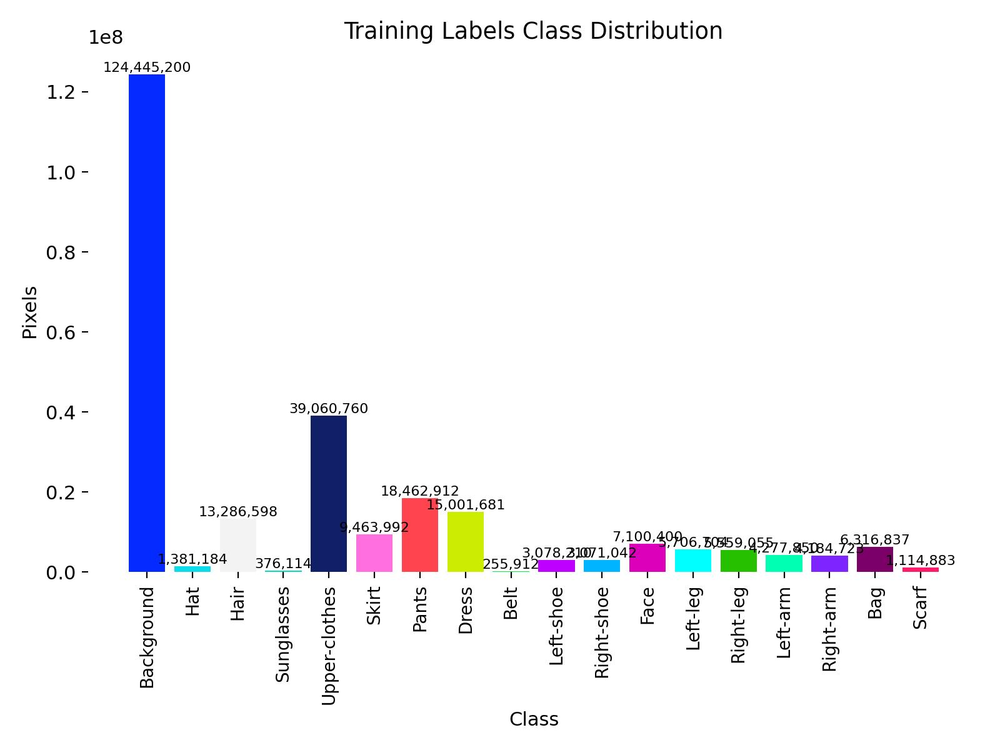

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/labels.jpg', width=600)

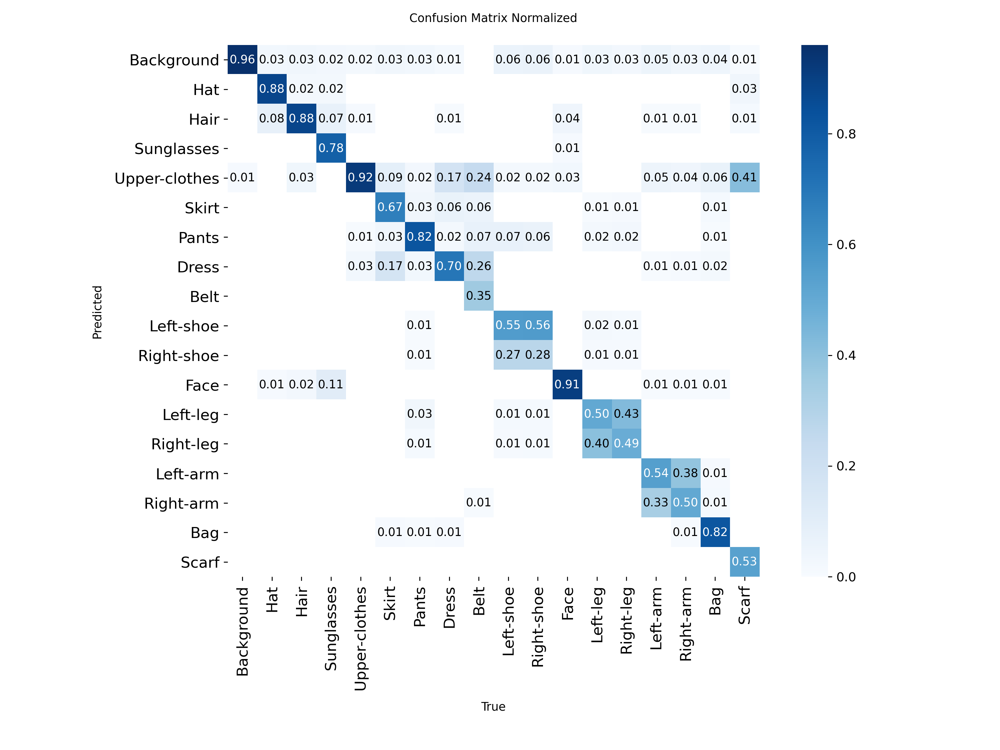

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/confusion_matrix_normalized.png', width=600)

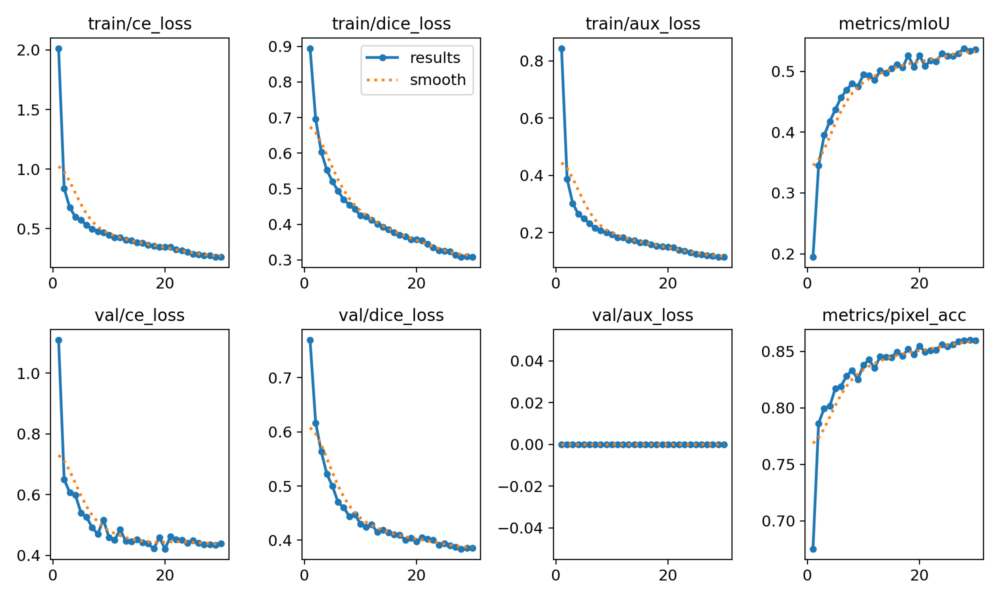

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/results.png', width=600)

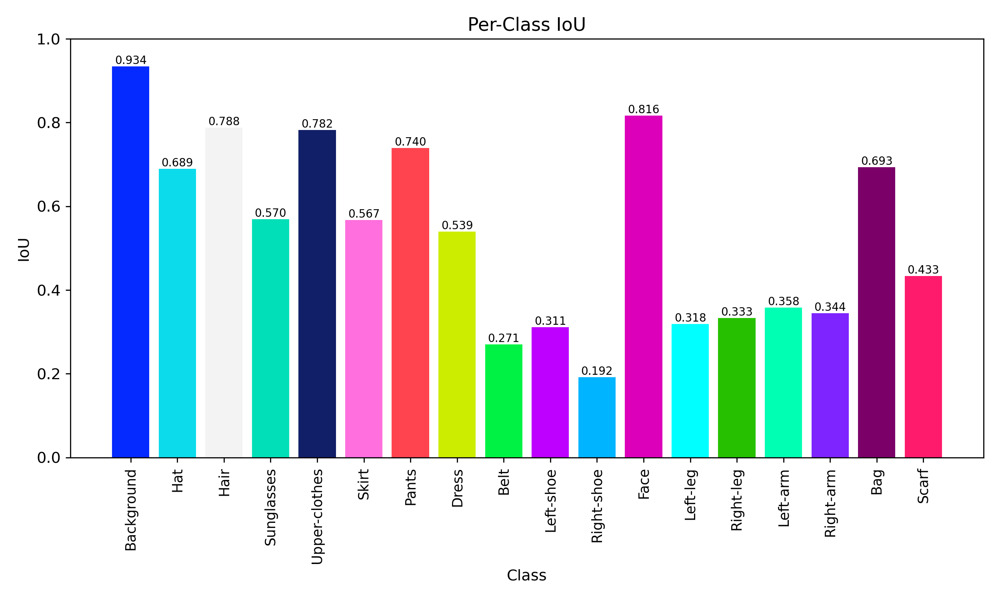

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/iou_bar_chart.png', width=600)

In [ ]:
model = YOLO("runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.pt")
model(source="/content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images", save=True)


image 1/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_104.jpg: 512x512 21.4ms
image 2/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_1174.jpg: 512x512 20.2ms
image 3/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_1261.jpg: 512x512 20.3ms
image 4/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_1273.jpg: 512x512 20.1ms
image 5/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_1338.jpg: 512x512 20.0ms
image 6/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_1521.jpg: 512x512 20.0ms
image 7/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_155.jpg: 512x512 20.0ms
image 8/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_158.jpg: 512x512 20.0ms
image 9/270 /content/gdrive/MyDrive/yolov11/datasets/humanparts/valid/images/2500_1592.jpg: 512x512 20.1ms
image 10/270 /content/gdrive/MyDrive/yo

[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: 'Background', 1: 'Hat', 2: 'Hair', 3: 'Sunglasses', 4: 'Upper-clothes', 5: 'Skirt', 6: 'Pants', 7: 'Dress', 8: 'Belt', 9: 'Left-shoe', 10: 'Right-shoe', 11: 'Face', 12: 'Left-leg', 13: 'Right-leg', 14: 'Left-arm', 15: 'Right-arm', 16: 'Bag', 17: 'Scarf'}
 obb: None
 orig_img: array([[[187, 217, 206],
         [187, 217, 206],
         [186, 216, 205],
         ...,
         [178, 221, 210],
         [178, 221, 212],
         [178, 221, 212]],
 
        [[177, 209, 198],
         [177, 209, 198],
         [175, 207, 196],
         ...,
         [176, 219, 208],
         [176, 219, 210],
         [176, 219, 210]],
 
        [[163, 197, 186],
         [163, 197, 186],
         [161, 195, 184],
         ...,
         [174, 217, 208],
         [174, 217, 208],
         [174, 217, 208]],
 
        ...,
 
        [[132, 158, 152],
         [132, 158, 152],
         [132, 159, 1

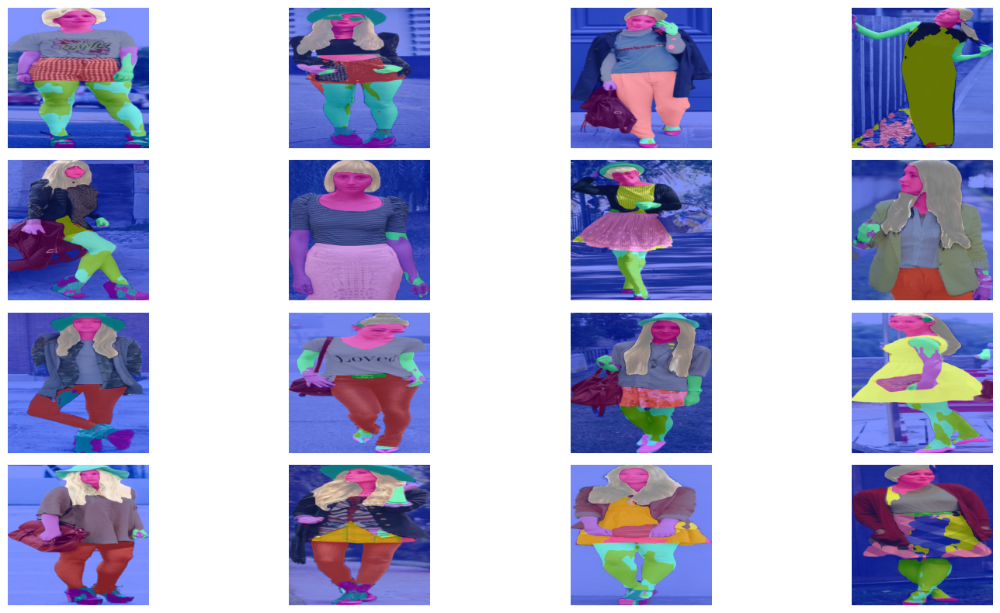

In [ ]:
import os, random, cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
results_dir = "/content/gdrive/MyDrive/yolov11/runs/semantic/predict"

# visualization layout
N = 16
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(results_dir, f)
            for f in os.listdir(results_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 2 * rows))

for i, image in enumerate(sample_imgs):
    plt.subplot(4, 4, i+1)
    plt.subplot(rows, cols, i + 1)
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
model.export(format='onnx')

Ultralytics 8.4.72 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from 'runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.pt' with input shape (1, 3, 512, 512) BCHW and output shape(s) (1, 18, 512, 512) (27.5 MB)

ONNX: starting export with onnx 1.22.0 opset 20...
ONNX: slimming with onnxslim 0.1.94...
ONNX: export success ✅ 2.8s, saved as 'runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.onnx' (50.1 MB)

Export complete (4.1s)
Results saved to /content/gdrive/MyDrive/yolov11/runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.onnx
Predict:         yolo predict task=semantic model=runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.onnx imgsz=512 
Validate:        yolo val task=semantic model=runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.onnx imgsz=512 data=datasets/humanparts.yaml 

'runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.onnx'

In [ ]:
import onnxruntime
import numpy as np
import cv2
import torch

img_path = "/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/valid/images/2500_1261.jpg"

img = cv2.imread(img_path)

if img is None:
    raise FileNotFoundError(f"Image not found at {img_path}")

img_resized = cv2.resize(img, (512, 512))
img_input = img_resized.astype(np.float32) / 255.0
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session = onnxruntime.InferenceSession("runs/semantic/YOLOv26-sem/YOLOv26-sem-e30/weights/best.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

print("Output:", [o.shape for o in outputs])

out0 = outputs[0]
print("out0 shape:", out0.shape)

Output: [(1, 18, 512, 512)]
out0 shape: (1, 18, 512, 512)


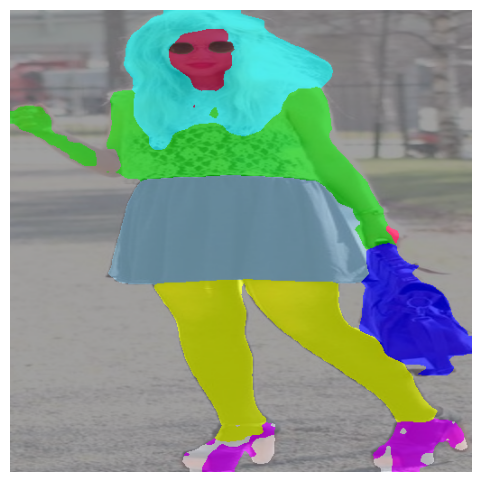

In [ ]:
CATEGORY_COLORS = {
    0: [120, 120, 120],
    1: [120, 120, 180],
    2: [230, 230, 6],
    3: [50, 50, 80],
    4: [3, 200, 4],
    5: [214, 190, 140],
    6: [7, 255, 235],
    7: [255, 5, 204],
    8: [230, 230, 230],
    9: [230, 230, 230],
    10: [255, 5, 224],
    11: [61, 5, 150],
    12: [30, 165, 205],
    13: [51, 255, 8],
    14: [82, 6, 255],
    15: [140, 255, 143],
    16: [255, 0, 0],
    17: [7, 51, 255],
}
orig_h, orig_w = img.shape[:2]

# 1. Create a color palette array (fast lookup)
palette_map = np.zeros((256, 3), dtype=np.uint8)
for i, color in CATEGORY_COLORS.items():
    palette_map[i] = color

# 2. Apply the colors in one vectorized step
mask = np.argmax(outputs[0].squeeze(), axis=0).astype(np.uint8)
color_mask = palette_map[mask] # Instant mapping

color_mask = cv2.resize(color_mask, (orig_w, orig_h))

# 3. Create a fast overlay
overlay = cv2.addWeighted(img, 0.3, color_mask, 0.7, 0)

import matplotlib.pyplot as plt
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

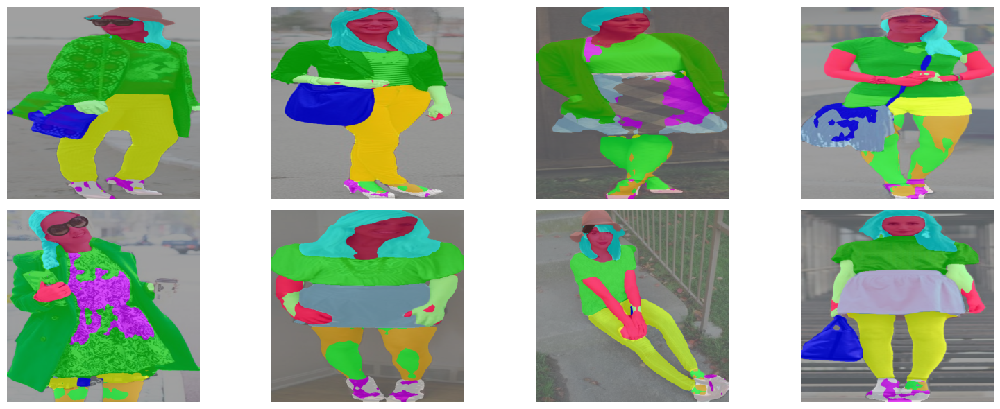

In [ ]:
import numpy as np
import os
import random
# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/PaddleDet-Models/datasets/humanparts/valid/images/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 3 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (512, 512))
    img_input = img_resized[:, :, ::-1].astype(np.float32) / 255.0
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    orig_h, orig_w = img.shape[:2]

    mask = np.argmax(outputs[0].squeeze(), axis=0).astype(np.uint8)
    color_mask = palette_map[mask] # Instant mapping

    color_mask = cv2.resize(color_mask, (orig_w, orig_h))
    overlay = cv2.addWeighted(img, 0.3, color_mask, 0.7, 0)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
model = YOLO("yolo26m-pose.pt")  # load a pretrained model
model.export(format='onnx')

Ultralytics 8.4.72 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
YOLO26m-pose summary (fused): 142 layers, 21,538,166 parameters, 0 gradients, 73.1 GFLOPs

PyTorch: starting from 'yolo26m-pose.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 300, 57) (46.8 MB)

ONNX: starting export with onnx 1.22.0 opset 20...


/usr/local/lib/python3.12/dist-packages/torch/onnx/_internal/torchscript_exporter/symbolic_opset11.py:954: UserWarning: Exporting aten::index operator of advanced indexing in opset 20 is achieved by combination of multiple ONNX operators, including Reshape, Transpose, Concat, and Gather. If indices include negative values, the exported graph will produce incorrect results.
  return opset9.index(g, self, index)


ONNX: slimming with onnxslim 0.1.94...
ONNX: export success ✅ 4.8s, saved as 'yolo26m-pose.onnx' (82.6 MB)

Export complete (7.2s)
Results saved to /content/gdrive/MyDrive/yolov11/yolo26m-pose.onnx
Predict:         yolo predict task=pose model=yolo26m-pose.onnx imgsz=640 
Validate:        yolo val task=pose model=yolo26m-pose.onnx imgsz=640 data=/home/mason/code/ultralytics/ultralytics/cfg/datasets/coco-pose.yaml  
Visualize:       https://netron.app


'yolo26m-pose.onnx'

In [ ]:
import onnxruntime
import numpy as np
import cv2
import torch

img_path = "/content/gdrive/MyDrive/Pytorch-Models/datasets/pose-tests/pose (4).jpg"

img = cv2.imread(img_path)

if img is None:
    raise FileNotFoundError(f"Image not found at {img_path}")

img_resized = cv2.resize(img, (640, 640))
img_input = img_resized.astype(np.float32) / 255.0
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session2 = onnxruntime.InferenceSession("yolo26m-pose.onnx", providers=["CUDAExecutionProvider"])
input_name2 = session2.get_inputs()[0].name
outputs2 = session2.run(None, {input_name2: img_input})

print("Output:", [o.shape for o in outputs2])

out0 = outputs2[0]

print("out0 shape:", out0.shape)

# inspect ONE prediction row
row = out0[0, 0]
print("one row length:", row.shape[0])
print("first 10 values:", row[:10])
print("last 40 values:", row[-40:])

Output: [(1, 300, 57)]
out0 shape: (1, 300, 57)
one row length: 57
first 10 values: [     173.77       231.3      306.37      418.99     0.92873           0      223.88       251.4     0.99343      227.97]
last 40 values: [    0.89221      215.32      249.45     0.62373      244.24      267.22     0.99505      212.64       271.4     0.98369       262.8      292.55     0.99262      211.26      296.92     0.96552      238.01      297.25      0.9845      190.46      296.87     0.98176      237.89      317.18     0.99761      213.85
      319.81     0.99571      259.91      355.21     0.99133      204.71      355.94     0.99256      293.99      373.04     0.98512      209.89      402.72     0.98714]


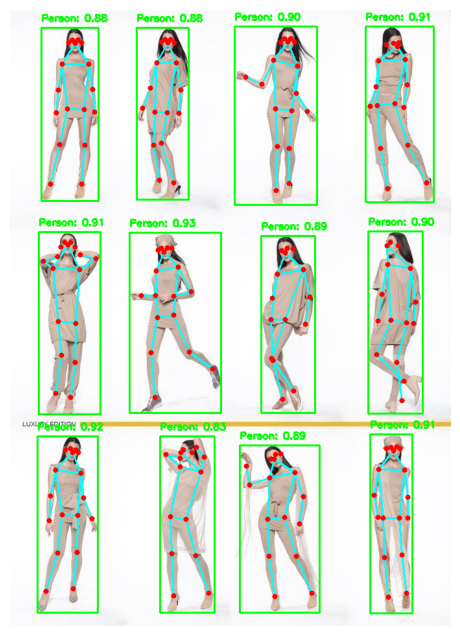

In [ ]:
h_orig, w_orig = img.shape[:2]
img_vis = img.copy()

CONF_THRESHOLD = 0.5

# COCO 17 keypoint connections
SKELETON_CONNECTIONS = [
    [0, 1], [0, 2],       # Nose to eyes
    [1, 3], [2, 4],       # Eyes to ears
    [0, 5], [0, 6],       # Nose to shoulders
    [5, 6],               # Shoulders
    [5, 7], [7, 9],       # Left Arm
    [6, 8], [8, 10],      # Right Arm
    [5, 11], [6, 12],     # Torso
    [11, 12],             # Hip
    [11, 13], [13, 15],   # Left Leg
    [12, 14], [14, 16],   # Right Leg
]

# Process the 300 rows
predictions = out0[0]  # Shape: (300, 57)

for row in predictions:
    box = row[0:4]
    score = row[4]
    class_id = int(row[5])
    keypoints_raw = row[6:] # The remaining 51 elements

    if score < CONF_THRESHOLD:
        continue

    # Scale factors from 640x640 input back to original image size
    x_scale = w_orig / 640.0
    y_scale = h_orig / 640.0

    # Unpack bounding box (assuming xyxy format based on values > center points)
    xmin = int(box[0] * x_scale)
    ymin = int(box[1] * y_scale)
    xmax = int(box[2] * x_scale)
    ymax = int(box[3] * y_scale)

    # Draw Bounding Box
    cv2.rectangle(img_vis, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
    cv2.putText(img_vis, f"Person: {score:.2f}", (xmin, ymin - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Parse Keypoints: Reshape 51 array into (17, 3) -> [x, y, conf]
    keypoints = keypoints_raw.reshape(17, 3)

    drawn_kpts = {}
    for i, kpt in enumerate(keypoints):
        kpt_x, kpt_y, kpt_conf = kpt

        if kpt_conf > 0.5:
            scaled_x = int(kpt_x * x_scale)
            scaled_y = int(kpt_y * y_scale)
            drawn_kpts[i] = (scaled_x, scaled_y)

    for start_idx, end_idx in SKELETON_CONNECTIONS:
        if start_idx in drawn_kpts and end_idx in drawn_kpts:
            cv2.line(img_vis, drawn_kpts[start_idx], drawn_kpts[end_idx], (255, 255, 0), 2)

    for idx, coord in drawn_kpts.items():
        cv2.circle(img_vis, coord, 4, (0, 0, 255), -1)

# --- Display ---
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

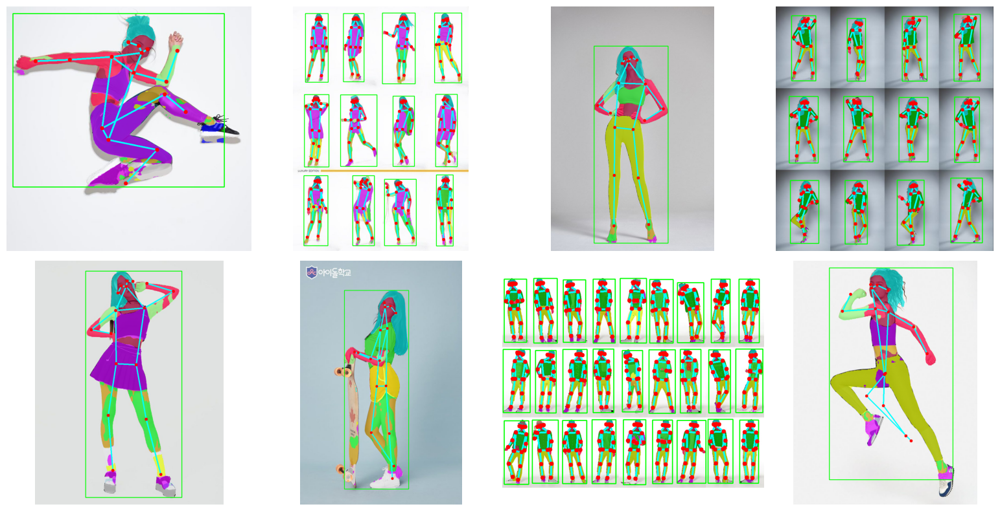

In [ ]:
import numpy as np
import os
import random
# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/Pytorch-Models/datasets/pose-tests/"

CONF_THRESHOLD = 0.3

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    h_orig, w_orig = img.shape[:2]
    img_resized = cv2.resize(img, (640, 640))
    img_input = img_resized.astype(np.float32) / 255.0
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs2 = session2.run(None, {input_name2: img_input})
    out0 = outputs2[0]

    img_vis = img.copy()

    predictions = out0[0]  # Shape: (300, 57)

    for row in predictions:
        box = row[0:4]
        score = row[4]
        class_id = int(row[5])
        keypoints_raw = row[6:] # The remaining 51 elements

        if score < CONF_THRESHOLD:
            continue

        # Scale factors from 640x640 input back to original image size
        x_scale = w_orig / 640.0
        y_scale = h_orig / 640.0

        # Unpack bounding box (assuming xyxy format based on values > center points)
        xmin = int(box[0] * x_scale)
        ymin = int(box[1] * y_scale)
        xmax = int(box[2] * x_scale)
        ymax = int(box[3] * y_scale)

        x1, x2 = np.clip([xmin, xmax], 0, w_orig - 1).astype(int)
        y1, y2 = np.clip([ymin, ymax], 0, h_orig - 1).astype(int)

        cropped_img = img[y1:y2, x1:x2]
        img_resized2 = cv2.resize(cropped_img, (512, 512))
        img_input2 = img_resized2[:, :, ::-1].astype(np.float32) / 255.0
        img_input2 = img_input2.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

        outputs = session.run(None, {input_name: img_input2})

        orig_h2, orig_w2 = cropped_img.shape[:2]

        mask = np.argmax(outputs[0].squeeze(), axis=0).astype(np.uint8)

        mask = cv2.resize(
            mask,
            (orig_w2, orig_h2),
            interpolation=cv2.INTER_NEAREST
        )

        # --- NEW: Create a foreground mask to skip background (class 0) ---
        bg_class_id = 0
        fg_mask = (mask != bg_class_id).astype(np.uint8) * 255  # Convert to 8-bit mask (0 or 255)

        # Resize both color mask and foreground mask to match the cropped dimensions
        color_mask = cv2.resize(palette_map[mask], (orig_w2, orig_h2), interpolation=cv2.INTER_NEAREST)
        fg_mask_resized = cv2.resize(fg_mask, (orig_w2, orig_h2), interpolation=cv2.INTER_NEAREST)

        # Blend the cropped image and the colors
        blended_crop = cv2.addWeighted(cropped_img, 0.3, color_mask, 0.7, 0)

        # Extract the ROI (Region of Interest) from the main image
        roi = img_vis[y1:y1+orig_h2, x1:x1+orig_w2]

        # Create a boolean index from the resized mask
        is_fg = fg_mask_resized > 0

        # Overwrite ONLY the foreground pixels inside the ROI
        roi[is_fg] = blended_crop[is_fg]

        # Put the updated ROI back into the main image
        img_vis[y1:y1+orig_h2, x1:x1+orig_w2] = roi

    for row in predictions:
        box = row[0:4]
        score = row[4]
        class_id = int(row[5])
        keypoints_raw = row[6:] # The remaining 51 elements

        if score < CONF_THRESHOLD:
            continue

        # Scale factors from 640x640 input back to original image size
        x_scale = w_orig / 640.0
        y_scale = h_orig / 640.0

        # Unpack bounding box (assuming xyxy format based on values > center points)
        xmin = int(box[0] * x_scale)
        ymin = int(box[1] * y_scale)
        xmax = int(box[2] * x_scale)
        ymax = int(box[3] * y_scale)

        # Draw Bounding Box
        cv2.rectangle(img_vis, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        # Parse Keypoints: Reshape 51 array into (17, 3) -> [x, y, conf]
        keypoints = keypoints_raw.reshape(17, 3)

        drawn_kpts = {}
        for i, kpt in enumerate(keypoints):
            kpt_x, kpt_y, kpt_conf = kpt

            if kpt_conf > 0.5:
                scaled_x = int(kpt_x * x_scale)
                scaled_y = int(kpt_y * y_scale)
                drawn_kpts[i] = (scaled_x, scaled_y)

        for start_idx, end_idx in SKELETON_CONNECTIONS:
            if start_idx in drawn_kpts and end_idx in drawn_kpts:
                cv2.line(img_vis, drawn_kpts[start_idx], drawn_kpts[end_idx], (255, 255, 0), 4)

        for idx, coord in drawn_kpts.items():
            cv2.circle(img_vis, coord, 6, (0, 0, 255), -1)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()

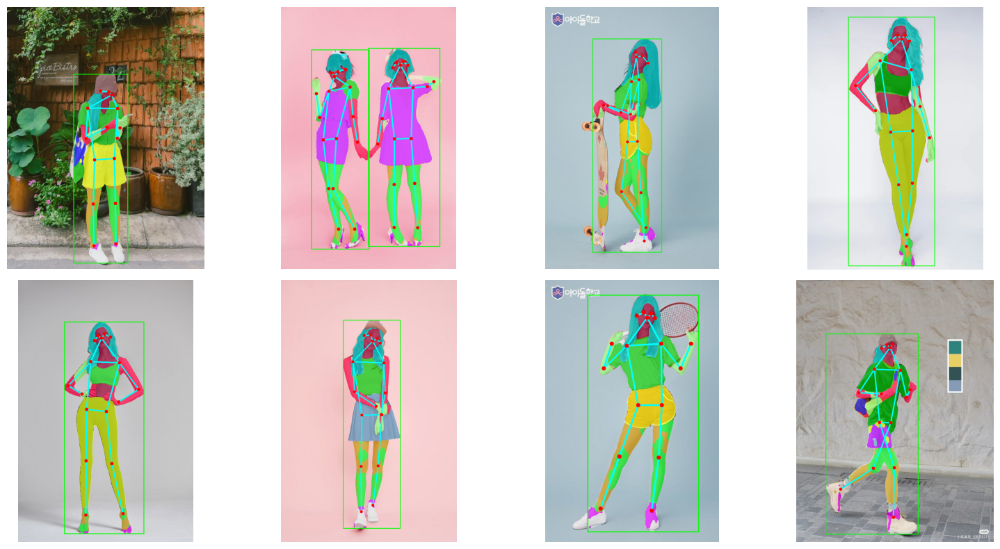

In [ ]:
import numpy as np
import os
import random
# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/Hugging Face/datasets/human-tests/"

CONF_THRESHOLD = 0.3

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    h_orig, w_orig = img.shape[:2]
    img_resized = cv2.resize(img, (640, 640))
    img_input = img_resized.astype(np.float32) / 255.0
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs2 = session2.run(None, {input_name2: img_input})
    out0 = outputs2[0]

    img_vis = img.copy()

    predictions = out0[0]  # Shape: (300, 57)

    for row in predictions:
        box = row[0:4]
        score = row[4]
        class_id = int(row[5])
        keypoints_raw = row[6:] # The remaining 51 elements

        if score < CONF_THRESHOLD:
            continue

        # Scale factors from 640x640 input back to original image size
        x_scale = w_orig / 640.0
        y_scale = h_orig / 640.0

        # Unpack bounding box (assuming xyxy format based on values > center points)
        xmin = int(box[0] * x_scale)
        ymin = int(box[1] * y_scale)
        xmax = int(box[2] * x_scale)
        ymax = int(box[3] * y_scale)

        x1, x2 = np.clip([xmin, xmax], 0, w_orig - 1).astype(int)
        y1, y2 = np.clip([ymin, ymax], 0, h_orig - 1).astype(int)

        cropped_img = img[y1:y2, x1:x2]
        img_resized2 = cv2.resize(cropped_img, (512, 512))
        img_input2 = img_resized2[:, :, ::-1].astype(np.float32) / 255.0
        img_input2 = img_input2.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

        outputs = session.run(None, {input_name: img_input2})

        orig_h2, orig_w2 = cropped_img.shape[:2]

        mask = np.argmax(outputs[0].squeeze(), axis=0).astype(np.uint8)

        mask = cv2.resize(
            mask,
            (orig_w2, orig_h2),
            interpolation=cv2.INTER_NEAREST
        )

        # --- NEW: Create a foreground mask to skip background (class 0) ---
        bg_class_id = 0
        fg_mask = (mask != bg_class_id).astype(np.uint8) * 255  # Convert to 8-bit mask (0 or 255)

        # Resize both color mask and foreground mask to match the cropped dimensions
        color_mask = cv2.resize(palette_map[mask], (orig_w2, orig_h2), interpolation=cv2.INTER_NEAREST)
        fg_mask_resized = cv2.resize(fg_mask, (orig_w2, orig_h2), interpolation=cv2.INTER_NEAREST)

        # Blend the cropped image and the colors
        blended_crop = cv2.addWeighted(cropped_img, 0.3, color_mask, 0.7, 0)

        # Extract the ROI (Region of Interest) from the main image
        roi = img_vis[y1:y1+orig_h2, x1:x1+orig_w2]

        # Create a boolean index from the resized mask
        is_fg = fg_mask_resized > 0

        # Overwrite ONLY the foreground pixels inside the ROI
        roi[is_fg] = blended_crop[is_fg]

        # Put the updated ROI back into the main image
        img_vis[y1:y1+orig_h2, x1:x1+orig_w2] = roi

    for row in predictions:
        box = row[0:4]
        score = row[4]
        class_id = int(row[5])
        keypoints_raw = row[6:] # The remaining 51 elements

        if score < CONF_THRESHOLD:
            continue

        # Scale factors from 640x640 input back to original image size
        x_scale = w_orig / 640.0
        y_scale = h_orig / 640.0

        # Unpack bounding box (assuming xyxy format based on values > center points)
        xmin = int(box[0] * x_scale)
        ymin = int(box[1] * y_scale)
        xmax = int(box[2] * x_scale)
        ymax = int(box[3] * y_scale)

        # Draw Bounding Box
        cv2.rectangle(img_vis, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        # Parse Keypoints: Reshape 51 array into (17, 3) -> [x, y, conf]
        keypoints = keypoints_raw.reshape(17, 3)

        drawn_kpts = {}
        for i, kpt in enumerate(keypoints):
            kpt_x, kpt_y, kpt_conf = kpt

            if kpt_conf > 0.5:
                scaled_x = int(kpt_x * x_scale)
                scaled_y = int(kpt_y * y_scale)
                drawn_kpts[i] = (scaled_x, scaled_y)

        for start_idx, end_idx in SKELETON_CONNECTIONS:
            if start_idx in drawn_kpts and end_idx in drawn_kpts:
                cv2.line(img_vis, drawn_kpts[start_idx], drawn_kpts[end_idx], (255, 255, 0), 4)

        for idx, coord in drawn_kpts.items():
            cv2.circle(img_vis, coord, 6, (0, 0, 255), -1)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()